AI CA3: Image Clustering                                                                                                           



 SayyedMohammadHoseinMazhari 810101520




# Image Clustering

### This project is about image clustering.We have several kinds of flowers which are labeled 0-9 and total 210 flowers.
### It has three steps:
   ##### 1) Preprocessing the images and extracting some features.
   ##### 2) Implementing clustering with k-means or DBSCAN algorithms.
   ##### 3) Dimension reduction .
### There are several ways for evaluating our model:
   ##### 1) silhouette
   ##### 2) homogeneity


## 1) Preprocessing

In [2]:
import os
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.applications.vgg16 import preprocess_input
from keras.applications.vgg16 import VGG16
from keras.models import Model
import numpy as np
import matplotlib.pyplot as plt
from random import randint
import pandas as pd
from sklearn.metrics import homogeneity_score, silhouette_score
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN


In [3]:
TARGET_SIZE = (224,224)

In [4]:
flowers_path = '/flower_images'
images_property = []
flowers_name = []
for filename in os.listdir(flowers_path):
    if filename.endswith('.png'):
        img_path = os.path.join(flowers_path, filename)
        img = load_img(img_path, target_size=TARGET_SIZE)
        img = img_to_array(img).reshape(1,224,224,3)
        img = preprocess_input(img)
        images_property.append(img)
        flowers_name.append(filename)
print(flowers_name)
# print((images_property))


['0022.png', '0025.png', '0102.png', '0079.png', '0058.png', '0095.png', '0194.png', '0149.png', '0103.png', '0136.png', '0065.png', '0021.png', '0050.png', '0012.png', '0159.png', '0013.png', '0069.png', '0174.png', '0134.png', '0086.png', '0002.png', '0010.png', '0083.png', '0104.png', '0015.png', '0144.png', '0066.png', '0040.png', '0193.png', '0001.png', '0206.png', '0135.png', '0044.png', '0055.png', '0178.png', '0064.png', '0120.png', '0157.png', '0107.png', '0152.png', '0006.png', '0003.png', '0203.png', '0132.png', '0034.png', '0036.png', '0038.png', '0208.png', '0067.png', '0078.png', '0191.png', '0057.png', '0183.png', '0031.png', '0100.png', '0154.png', '0140.png', '0043.png', '0076.png', '0035.png', '0177.png', '0125.png', '0113.png', '0075.png', '0165.png', '0126.png', '0186.png', '0053.png', '0037.png', '0019.png', '0147.png', '0117.png', '0054.png', '0032.png', '0181.png', '0073.png', '0128.png', '0195.png', '0099.png', '0137.png', '0060.png', '0151.png', '0017.png', '00

In [5]:
model = VGG16()
model = Model(inputs = model.inputs, outputs = model.layers[-2].output)
attributes = np.array([model.predict(flower) for flower in images_property]).reshape(-1,4096)
print(attributes)

1/1 [==============================] - 2s 2s/step
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.25967458 1.6816556  0.        ]
 [0.         0.         0.         ... 2.646236   1.1889918  0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 2.5454385  0.         0.        ]]


In [6]:
model.predict(images_property[0])

1/1 [==============================] - 1s 1s/step


array([[0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

### Q1. Why do we extract features?Why isn't reading pixels enough ? Explain the reasons.

When clustering images, feature extraction is crucial for several reasons, making it a more effective method than simply using raw pixel values:

1. **High Dimensionality:** Directly using pixel values of images can lead to very high-dimensional data, especially with large or high-resolution images. High-dimensional spaces suffer from the "curse of dimensionality," where the distance between any two points (or images, in this case) becomes less meaningful. This phenomenon significantly affects the performance of clustering algorithms.

2. **Invariance:** Features extracted by methods like VGG16 provide a form of abstraction from raw pixel values, capturing essential aspects of the image content that are invariant to minor changes in light, angle, or scale. This means that two images of the same object with slight variations in angle or lighting would still be close in the feature space, unlike in the raw pixel space.

3. **Noise Reduction:** Raw pixel data can include a lot of noise (e.g., variations in lighting, shadows). Feature extraction algorithms are designed to capture the underlying patterns in the data, ignoring irrelevant variations and noise, thereby simplifying the data and enhancing the clustering process.

4. **Semantic Information:** Deep learning models like VGG16 are trained on large datasets (like ImageNet) and learn to identify semantic components of the images (like objects). Using these learned features means clustering can be based on the semantic content of the images rather than just the raw visual data. This approach is particularly powerful for complex image datasets where understanding content and context is crucial.
crucial.

### Q2. Search about extracting features from images and describe the three techniques.


Feature extraction from images is a critical step in many computer vision tasks. It involves transforming the raw data (pixels) into a set of features that are more informative and non-redundant, facilitating subsequent learning and generalization steps in machine learning models.Three Techniques for Feature Extraction:

1. **Color Histograms:** Color histograms represent the distribution of colors within an image. They count how many times each color appears in the image. This is useful because the color distribution can help distinguish between different objects, regardless of their orientation or size.

2. **Edge Detection:** Edge detection algorithms identify the boundaries of objects within an image. These edges are detected by looking for discontinuities in pixel intensity. Edge features are particularly useful for object recognition tasks where the shape of an object is a critical identifier.

3. **Texture Features:** Texture features measure the texture of an area in an image, which involves analyzing the spatial arrangement of colors or intensities in an image or selected region. Common methods include using filters like Gabor, wavelet transform, or gray-level co-occurrence matrix (GLCM). These features help in differentiating between surfaces and recognizing patterns.


These feature extraction techniques provide different insights into the content of an image and are used depending on the specific requirements of the task at hand. In practice, combining multiple types of features can often provide more robust and discriminative information for complex image analysis tasks.
.
 size.

### Q3. What kind of preproccess should be done on images to prepare them for entering the model?

Preprocessing images is a crucial step before feeding them into a machine learning or deep learning model. This stage involves several techniques that help expose more relevant features of the images to the model.

1. **Resizing Images:** Models usually require a fixed size for their inputs. Therefore, images should be resized to the desired dimensions.
2. **Color Transformation:** Some models might require images in specific color formats, such as RGB or grayscale.
3. **Normalization:** Images are typically normalized so that pixel values fall within a certain range, usually between 0 and 1 or -1 to +1, which helps optimize model learning.

4. **Standardization:** Standardizing data involves adjusting the mean and standard deviation of the image pixels so that they have a mean of zero and a standard deviation of one. This can help improve model performance.


5. **Data Augmentation:** To increase the diversity of training data and prevent overfitting, techniques such as image rotation, scaling, cropping, and flipping can be used.
be used.




## 2) Implementing Clustering


In [7]:
def clustering(flowers, clusters):
    groups = {cluster: [] for cluster in clusters}
    for flower, cluster in zip(flowers, clusters):
            groups[cluster].append(flower)
    return groups

In [8]:
def show_cluster(files):
    plt.figure(figsize = (25,25))
    for index, file in enumerate(files):
        plt.subplot(15,15,index+1)
        img = load_img('/flower_images/' + file)
        img = np.array(img)
        plt.imshow(img)
        plt.axis('off')

### Q4: Explain about the K-means DBSCAN methods and the advantages and disadvantages of these methods.

#### K-means Clustering

**How it Works**:
- K-means is a centroid-based clustering algorithm that partitions the data into K pre-defined distinct non-overlapping subgroups (clusters) where each data point belongs to only one group.
- It tries to make the inter-cluster data points as similar as possible while keeping the clusters as different (or as far apart) as possible.
- The algorithm iterates between two steps: assigning data points to the nearest cluster centroid and then updating the centroid to be the mean of its assigned points.

**Advantages**:
1. **Efficiency**: It's generally fast and efficient in terms of computational cost, typically O(K*n*d), where n is the number of data points, K is the number of clusters, and d is the number of attributes.
2. **Simplicity and Ease of Implementation**: K-means is simple to understand and easy to implement.
3. **Scalability**: Works well with large datasets.

**Disadvantages**:
1. **Choosing K**: You need to specify the number of clusters (K) in advance.
2. **Sensitivity to Initial Centroids**: The initial placement of centroids can affect the final outcome.
3. **Sensitivity to Outliers**: Outliers can skew the results because K-means tries to optimize the sum of squares.
4. **Assumption of Spherical Clusters**: It assumes that clusters are of spherical shape and evenly sized, which might not always be the case.

#### DBSCAN (Density-Based Spatial Clustering of Applications with Noise)

**How it Works**:
- DBSCAN is a density-based clustering algorithm that creates clusters based on the idea of density reachability and connectivity.
- It separates the dataset into three types of points: core points, border points, and noise points, based on the density (the number of points within a given radius).
- A cluster grows as long as there are enough dense points within the neighborhood.

**Advantages**:
1. **No Need to Specify the Number of Clusters**: Unlike K-means, DBSCAN doesn't require you to specify the number of clusters beforehand.
2. **Handling Outliers**: It is good at handling noise and outliers.
3. **Arbitrary Cluster Shapes**: Can find arbitrarily shaped clusters.
4. **Robust to Noise**: DBSCAN is resistant to noise points.

**Disadvantages**:
1. **Choosing Parameters**: DBSCAN requires setting the radius (epsilon) and the minimum number of points required to form a dense region (minPts), which can be non-trivial.
2. **Varying Densities**: Struggles with datasets where the density varies significantly across clusters.
3. **High-Dimensional Data**: Performance degrades in high-dimensional spaces.

#### Summary
- **K-means** is best suited for datasets with spherical clusters and is computationally more efficient for large datasets, but it requires the number of clusters to be specified and can be sensitive to outliers and initial centroids.
- **DBSCAN** is excellent for datasets with clusters of arbitrary shapes and varying densities. It is more robust to outliers and does not require specifying the number of clusters, but choosing its parameters can be challenging, and it may struggle with high-dimensional data.termine algorithm parameters



### Q5. What method have you used to find the most appropriate K in the Means-K method? Explain.
By plotting the elbow /knee plot,we can find the break point and these break points seam to be the most appropriate k in the k-means method.

### Q6. Compare the output of two types of clustering.
It seams that k-means is clustering algorithm for this data and as we see in the bottom,it is more accurate in both metrics.

## 3) Dimension reduction


### Q7: what is PCA and briefly explain how it works.
PCA (Principal Component Analysis) is a statistical technique used in the field of data analysis and machine learning for dimensionality reduction while preserving as much of the data's variation as possible. It transforms the data into a new coordinate system, such that the greatest variance by any projection of the data comes to lie on the first coordinate (called the first principal component), the second greatest variance on the second coordinate, and so on.

#### How PCA Works:

1. **Standardization**: The first step in PCA is often to standardize the data so that each feature contributes equally to the analysis. This involves scaling the data so that each feature has a mean of 0 and a standard deviation of 1.

2. **Covariance Matrix Computation**: PCA starts by computing the covariance matrix of the data, which helps in understanding how each variable in the data relates to the others.

3. **Eigenvalue and Eigenvector Calculation**: The algorithm then calculates the eigenvalues and eigenvectors of this covariance matrix. Eigenvectors point in the direction of the largest variance, and eigenvalues correspond to the magnitude of these eigenvectors.

4. **Sort and Rank**: The eigenvalues and corresponding eigenvectors are sorted in order of decreasing eigenvalues. The larger an eigenvalue, the more of the data's variance that its corresponding eigenvector captures.

5. **Principal Component Selection**: The next step is selecting the top `k` eigenvectors (where `k` is the number of dimensions you want to keep) based on their corresponding eigenvalues. These eigenvectors are the principal components of the data.

6. **Transformation**: Finally, the original data is transformed into this new space (of `k` dimensions) using the principal components. The transformed data represents the original data in the new coordinate system of the principal components, reducing the number of dimensions while attempting to preserve the variability present in the original data.

#### Summary

- PCA is particularly useful in processing data with a large number of dimensions (features).
- It helps in visualizing high-dimensional data, compressing data, and speeding up learning algorithms.
- While PCA is a powerful tool, one of its limitations is that it assumes linear relationships among variables and might not work effectively with data that has non-linear structures.s.







In [9]:
read_labels = pd.read_csv('/flower_labels.csv')
extracted_labels = [read_labels[read_labels['file'] == flower]['label'].iloc[0] for flower in flowers_name]

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


0.6671085335723375
0.094491035
i:
['0022.png', '0103.png', '0134.png', '0135.png', '0178.png', '0152.png', '0208.png', '0191.png', '0140.png', '0070.png', '0090.png', '0046.png', '0200.png', '0148.png', '0112.png', '0205.png', '0123.png', '0082.png', '0088.png', '0052.png', '0142.png']
i:
['0025.png', '0194.png', '0086.png', '0104.png', '0144.png', '0066.png', '0203.png', '0034.png', '0078.png', '0057.png', '0154.png', '0075.png', '0037.png', '0019.png', '0131.png', '0170.png', '0020.png', '0176.png', '0115.png', '0108.png', '0033.png', '0059.png', '0111.png', '0124.png', '0158.png', '0011.png', '0096.png', '0028.png', '0071.png', '0182.png', '0121.png', '0198.png', '0007.png', '0093.png', '0161.png']
i:
['0102.png', '0021.png', '0003.png', '0132.png', '0113.png', '0151.png', '0145.png', '0122.png', '0179.png', '0127.png', '0024.png', '0190.png', '0106.png', '0039.png', '0094.png', '0027.png', '0087.png', '0061.png', '0139.png']
i:
['0079.png', '0095.png', '0149.png', '0065.png', '0050

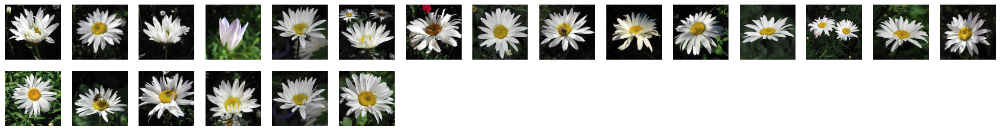

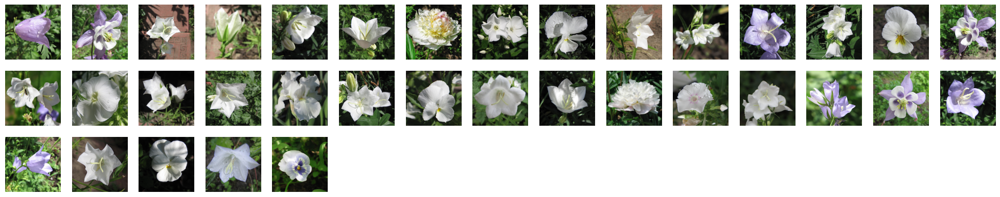

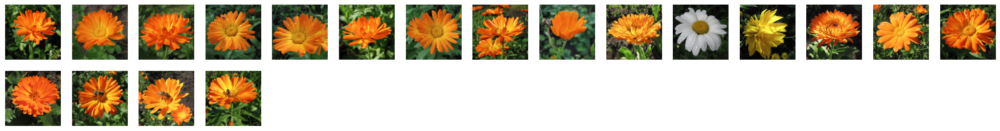

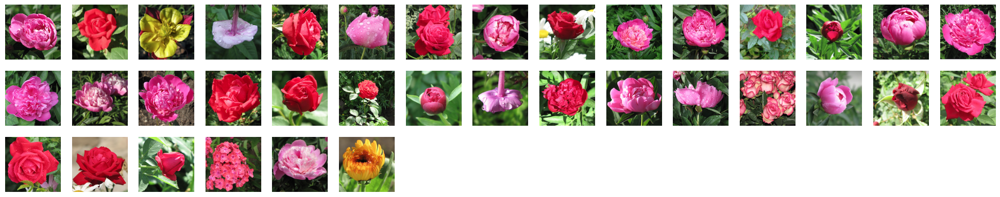

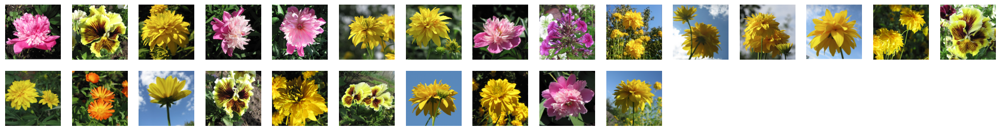

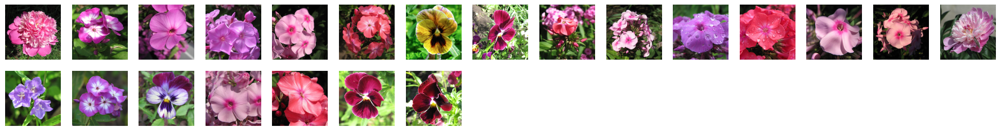

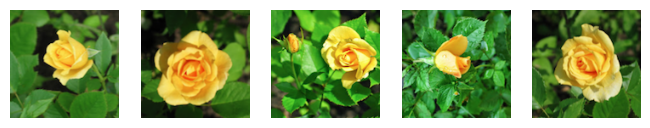

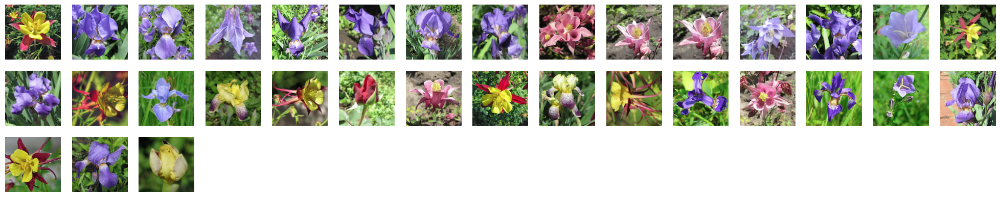

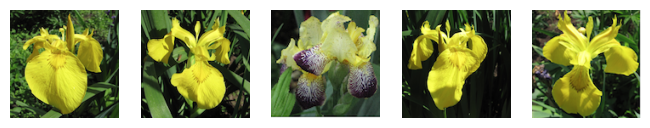

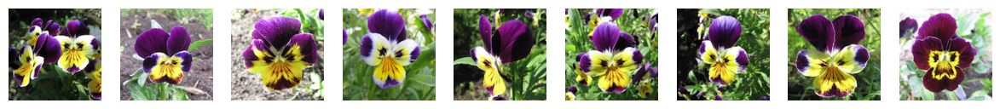

In [10]:
kmeans = KMeans(n_clusters=len(read_labels['label'].unique()))
kmeans
kmeans.fit(attributes)
print(homogeneity_score(kmeans.labels_, extracted_labels))
print(silhouette_score(attributes, kmeans.labels_))
groups = clustering(flowers_name, kmeans.labels_)
# print(groups.values)
for i in groups.values():
    print("i:")
    print(i)
    show_cluster(i)

In [11]:
for i in range(len(groups)):
  print(len(groups[i]))
for i in range(0,10):
  print(extracted_labels.count(i))

5
21
22
36
19
35
5
25
9
33
21
20
19
22
21
25
23
15
26
18


Text(0.5, 1.0, 'K-means Clustering with PCA')

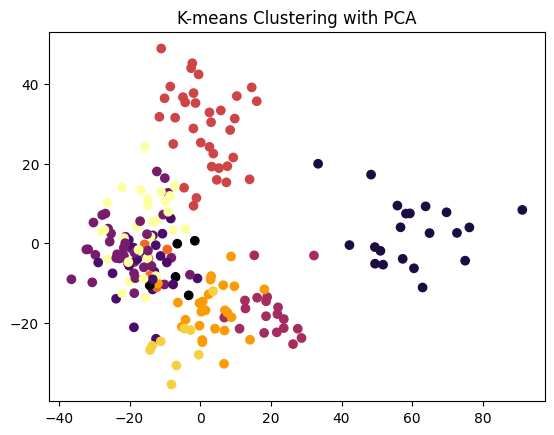

In [15]:


pca_2d = PCA(n_components=13).fit_transform(attributes)#n_comp = 2

fig = plt.figure()
plt.scatter(pca_2d[:, 0], pca_2d[:, 1], c=kmeans.labels_, cmap='inferno')
plt.title('K-means Clustering with PCA')

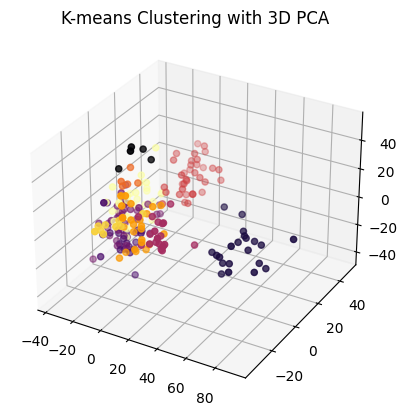

In [16]:
pca_3d = PCA(n_components=13).fit_transform(attributes)#n_com = 3

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')#avalish 111
ax.scatter(pca_3d[:, 0], pca_3d[:, 1], pca_3d[:, 2], c=kmeans.labels_, cmap='inferno')
ax.set_title('K-means Clustering with 3D PCA')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

Text(0, 0.5, 'Sum of squared distance')

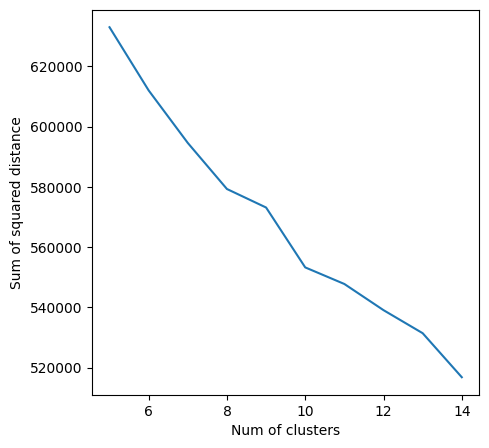

In [23]:
ssd = []
list_k = list(range(5, 15))
for k in list_k:
    km = KMeans(n_clusters=k)
    km.fit(attributes)

    ssd.append(km.inertia_)

# Plot sse against k
plt.figure(figsize=(5, 5))
plt.plot(list_k, ssd)
plt.xlabel(r'Num of clusters')
plt.ylabel('Sum of squared distance')

0.5467497257768086


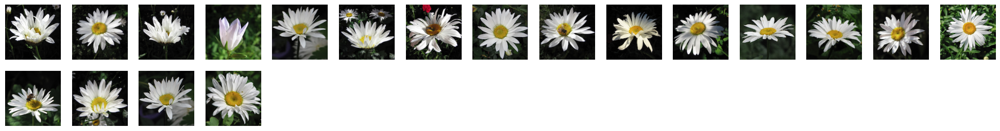

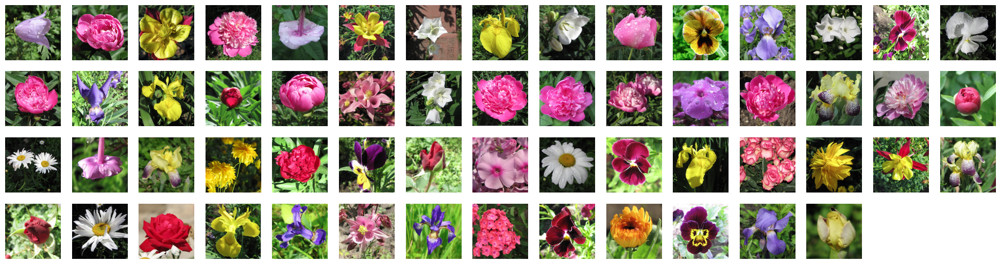

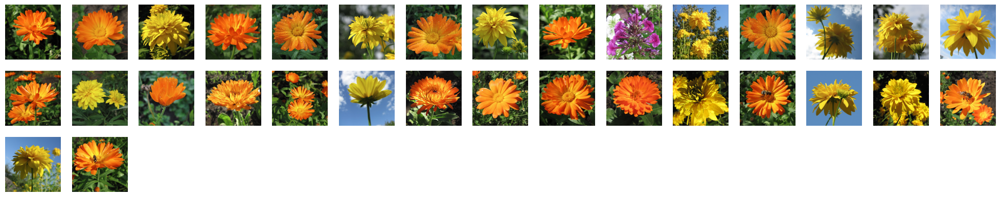

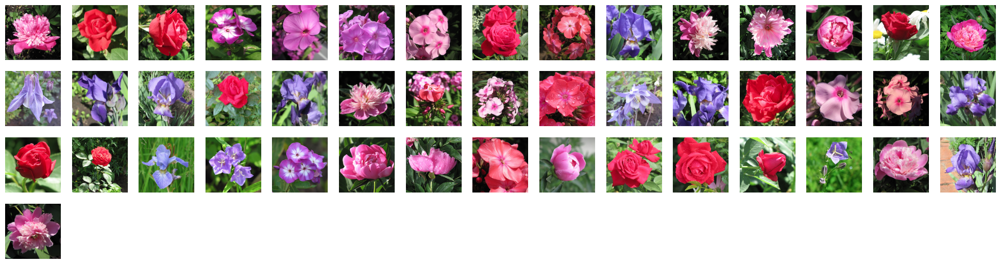

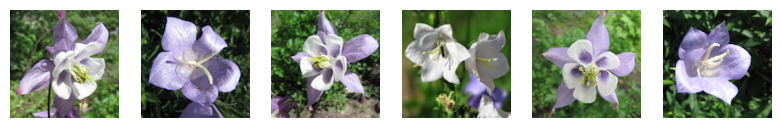

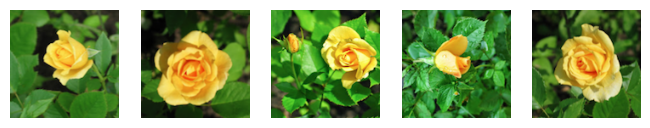

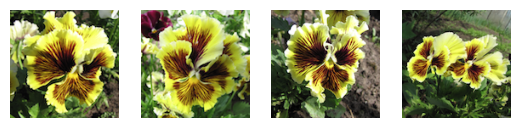

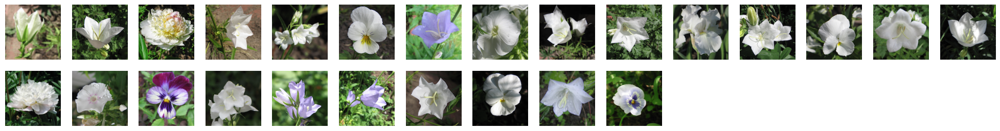

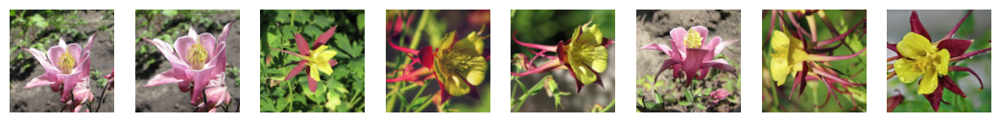

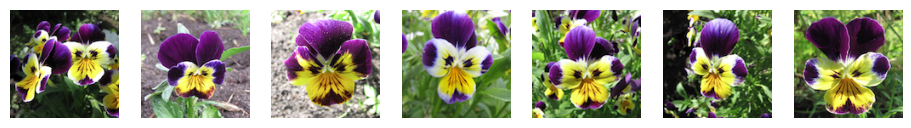

In [76]:
# i,j,k = 26,7,9
#31.90, 4, 17
# i = 26
# j = 7,8,9 (7 asli)
# k = 8 , 9 (9 asli)
# 3 7 19   4 7 23
i,j,k =32,4,17
pca = PCA(n_components=k).fit_transform(attributes)
dbscan = DBSCAN(eps=i, min_samples=j)
dbscan.fit(pca)
print(homogeneity_score(dbscan.labels_, extracted_labels))
# for k in range(3,13):
#   for j in range(6,20):
#     for i in range(3,25):
#       print("k , j , i : ",k,j,i)
#       pca = PCA(n_components=k).fit_transform(attributes)
#       dbscan = DBSCAN(eps=i, min_samples=j)
#       dbscan.fit(pca)
#       print(homogeneity_score(dbscan.labels_, extracted_labels))
groups = clustering(flowers_name, dbscan.labels_)
# print("i,j,k max_homo ,max_homo:",i_max_homo,j_max_homo,k_max_homo,max_homo)
# print("i,j,k max_silh ,max_silh:",i_max_silh,j_max_silh,k_max_silh,max_silh)
for i in groups.values():
    show_cluster(i)


Text(0.5, 1.0, 'DBScan Clustering with PCA')

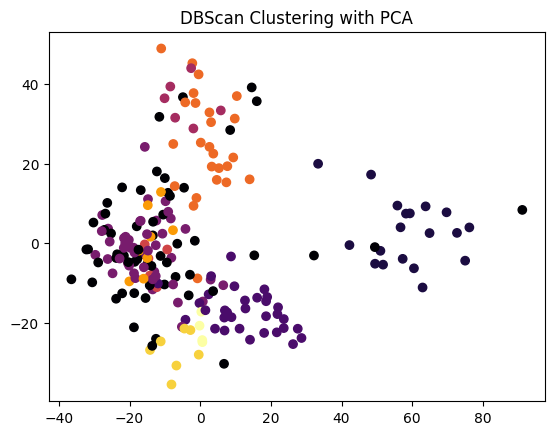

In [79]:
pca_2d = PCA(n_components=2).fit_transform(attributes)#n_comp =2

fig = plt.figure()
plt.scatter(pca_2d[:, 0], pca_2d[:, 1], c=dbscan.labels_, cmap='inferno')
plt.title('DBScan Clustering with PCA')

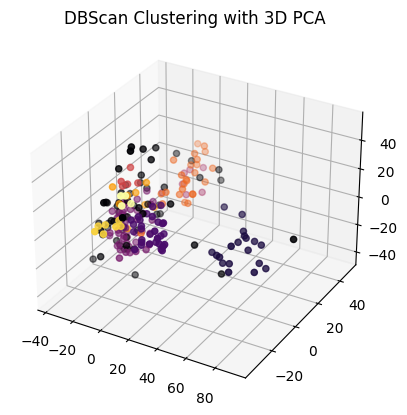

In [80]:
pca_3d = PCA(n_components=3).fit_transform(attributes)#n_comp = 3

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(pca_3d[:, 0], pca_3d[:, 1], pca_3d[:, 2], c=dbscan.labels_, cmap='inferno')
ax.set_title('DBScan Clustering with 3D PCA')
plt.show()

## 4) Evaluation

### Q8. Explain how to calculate the silhouette homogeneity criterion.


1. **Silhouette Coefficient**: The silhouette coefficient is a measure of how well each sample within a cluster fits its assigned cluster and how distinct it is from the neighboring clusters. It provides an assessment of clustering quality. The silhouette coefficient (\(s\)) for a specific sample is calculated using the following formula:

   $[ s = \frac{b - a}{\max(a, b)} ]$

   where \(a\) is the mean distance between the sample and other points within the same cluster, and \(b\) is the mean distance between the sample and points in the nearest neighboring cluster. The silhouette coefficient ranges from -1 to 1, where values close to 1 indicate well-separated clusters, values close to 0 indicate overlapping clusters, and values close to -1 indicate misclassified samples.

   To compute the overall silhouette coefficient for a clustering algorithm, the average silhouette coefficient across all samples is calculated.

2. **Homogeneity Score**: The homogeneity score measures how well each cluster contains only samples that belong to a single class or category. It is used to evaluate the quality of a clustering algorithm when the ground truth labels are known. The homogeneity score ranges from 0 to 1, where values close to 1 indicate high homogeneity, meaning each cluster consists of samples from a single class.

   The homogeneity score is calculated using entropy-based metrics. It quantifies the similarity between the clustering labels and the ground truth labels. Higher values indicate better cluster homogeneity.

   It's important to note that the silhouette coefficient and homogeneity score are distinct metrics used for different purposes. The silhouette coefficient assesses the overall clustering quality, while the homogeneity score evaluates the degree to which each cluster represents a single class or category.
   

_______________________________________________________________________________


To calculate the silhouette homogeneity criterion, you can follow these steps:

1. **Calculate the cluster centroids or means:** First, you need to calculate the centroid or mean for each cluster in your dataset. The centroid is the average position of all the data points in a cluster.

2. **Calculate the distance between each data point and all cluster centroids:** For each data point, calculate the distance to each cluster centroid. You can use a distance metric such as Euclidean distance or any other suitable metric.

3. **Determine the nearest and second-nearest cluster centroids for each data point:** For each data point, identify the nearest and second-nearest cluster centroids based on the distances calculated in the previous step.

4. **Calculate the silhouette value for each data point:** The silhouette value for a data point measures how similar it is to other data points in its own cluster compared to data points in other clusters. It is calculated using the formula:
   silhouette value = (b - a) / max(a, b)
   where a is the average distance from the data point to other data points in the same cluster, and b is the average distance from the data point to data points in the nearest neighboring cluster.

5. **Calculate the average silhouette value for all data points:** Finally, calculate the average silhouette value for all data points in the dataset to obtain the overall silhouette homogeneity criterion.

This criterion can be used to assess the homogeneity of clusters, with higher values indicating that the clusters are well-defined and homogeneouss labels or ground truth
le class. Both scores are useful for evaluating the quality of clustering algorithms.

### Q9. Report the results of the mentioned criteria for each of the methods.
It has been evaluated above .

### Q10. Suggest solutions to improve the performance of the models

Improving the performance of KMeans and DBSCAN clustering algorithms involves various strategies, from preprocessing the data to fine-tuning algorithm parameters. Here are some suggestions for both:

#### KMeans

1. **Feature Scaling**: KMeans is sensitive to the scale of the data. Features on larger scales can dominate the algorithm's behavior. Standardizing or normalizing your data ensures that each feature contributes equally to the distance computations.

2. **Feature Selection**: Remove irrelevant or redundant features. KMeans can perform poorly if the dataset contains features that are not useful for clustering.

3. **Choosing the Right Number of Clusters (`k`)**: Use methods like the Elbow Method, the Silhouette Coefficient, or the Gap Statistic to determine an appropriate number of clusters.

4. **Initializing Centroids Wisely**: The default method in scikit-learn's KMeans is 'k-means++', which is generally better than random initialization. However, running the algorithm multiple times with different initializations and choosing the best result can also be beneficial.

5. **Handling Non-spherical Data**: KMeans assumes that clusters are spherical and equally sized, which is not always the case. Sometimes transforming the data, e.g., using PCA for dimensionality reduction, can lead to more spherical clusters.

#### DBSCAN

1. **Parameter Tuning**:
   - **`eps` and `min_samples`**: These are crucial parameters. Use a k-distance plot to choose an appropriate `eps` value. The `min_samples` can be set based on domain knowledge or experimental tuning.
   - **Distance Metric**: The choice of distance metric (Euclidean, Manhattan, etc.) can significantly affect the results. Choose one that makes sense for your data.

2. **Data Scaling**: Like KMeans, DBSCAN is sensitive to the scale of the data. Normalizing or standardizing your features can lead to better clustering results.

3. **Dealing with High Dimensionality**: In high dimensions, distance metrics become less useful (curse of dimensionality). Dimensionality reduction techniques like PCA or t-SNE might help before applying DBSCAN.

4. **Handling Noise**: DBSCAN can identify outliers as noise. Analyzing these noise points can provide insights and help in adjusting parameters if too many points are classified as noise.

5. **Experimenting with Different Parameters**: There's no one-size-fits-all set of parameters for DBSCAN. Experiment with different values of `eps` and `min_samples`, and assess the clustering results.

#### General Tips for Both Algorithms

- **Understanding Your Data**: Know the characteristics of your dataset. Clustering is an exploratory technique, and its success often hinges on how well the data and its features represent the problem you're trying to solve.

- **Use of Domain Knowledge**: Incorporating domain knowledge can guide you in preprocessing, feature engineering, and interpreting the results.

- **Evaluation Metrics**: Use internal evaluation metrics like the Silhouette Coefficient, Calinski-Harabasz Index, or Davies-Bouldin Index to assess the quality of clusters.

- **Visualizing Results**: If feasible, visualize your clustering results using techniques like scatter plots or t-SNE. This can give you insights into the clusters and how well the algorithm is performing.

- **Algorithm Selection**: Sometimes, the chosen algorithm might not be the best fit for the data. Be open to trying different clustering algorithms.

Remember, clustering is as much an art as it is a science, and iterative experimentation is often key to finding the best approach for your specific dataset..